## Data compression using Deep learning

Image Compression is one of computer vision applications, computer networks, computer architecture, and many other fields. **Autoencoders** are unsupervised neural networks that use machine learning to do this compression task.



In this project, you are supposed to learn to have a complete insight into autoencoders, and a good comprehension of data compression  in the following sequence:

- What is Autoencoder?
- Architecture of Autoencoders
- Properties & Hyperparameters

Data Compression using Autoencoders (Demo)


### Autoencoder Definition
An autoencoder neural network is an Unsupervised learning algorithm that applies backpropagation (learning rules), **setting the target values to be equal to the inputs** ==> unsupervised. Autoencoders are used to reduce the size of our inputs into a smaller representation. If anyone needs the original data, they can reconstruct it from the compressed data. 

<p align="center">
  <a href="url"><img src="https://raw.githubusercontent.com/mymehio/test/master/autencoder%20components2.png" align="middle" height="280" width="600" ></a>
</p>

### Architecture of Autoencoders
Autoencoder consists of three components:
* **Encoder**: It is the network that compresses the input into a latent space representation, where encoder layers encode the input image as a compressed representation in a reduced dimension.
The encoder layer encodes the input image as a compressed representation in a reduced dimension. The compressed image is the distorted version of the original image.
* **Code (latent vector / bottleneck)** :it represents the compressed version of input which is fed to the decoder.
* **Decoder**: This part in inverted neural network, that decodes the encoded image (compressed representation) back to the original dimension. The decoded image is a lossy reconstruction of the original image and it is reconstructed from the latent space representation.





In [ ]:
!pip install --upgrade imutils

## Peformance Evaluation of compression
To evaluate the performance of your algorithm, after training, you need to calculate two measurments: 
- **Compression rate** : the higher the compression rate, the more we compress, the better your algorithm
- **PSNR** (Peak signal-to-noise ratio): that measures the quality of image after compression: the higher the PSNR, the better quality we get after compression

Therefore, the evaluation of compression depends on both measurements together. Sometimes, a higher compression rate can produce a bad quality of compression, because here we compresse severely, so we need to find the best trad-off between compression rate and PSNR

Usually, we calculate the compression rate as : (original_size - compressed_size) / original_size

- original_size:  is the size of original image
- compressed_size: size of latent space you decide upon building your model



```
Tip: To benchmark your model on a testing data set, you need to calculate the:  

Averaged PSNR = sum of PSNR of each image / Number of tested images
```




### Build your architecture 
Let's Build the model

## Data Generation 
What are the data that we have to compress ? 
Indeed, we don't have a ready dataset, so we need to generate it.

In automotive, we need to lighten the road during the night drive by high beam pattern, or Low beam pattern. You can consider these patterns as photmetric images, that the projector of headlamp use them to project the light, as seen in this link : https://docs.google.com/presentation/d/1QUx7eb9GtT-NJWqXoeWHfsT300MRD9sZ2lzhPCL1bK4/edit?usp=sharing


So we need to generate the basic pattern, Low beam and High beam patterns


##Generate High beam
To simplify our purpose, we consider the HB as if it's a 2D Gaussian distribution , so simply we generate a 2D matrix of coefficients, produced by gaussian function, as following: 

(80, 320)

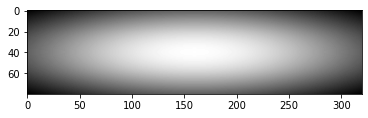

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import matplotlib
from mpl_toolkits.mplot3d import Axes3D
import cv2
#considering the size of image is 80 lines x 320 columns

X,Y=np.meshgrid(np.linspace(-1,1,320),np.linspace(-1,1,80));
mu,sigma=0,1; #suppose that mux=muy=mu=0 and sigmax=sigmay=sigma

#gaussian function
G=np.exp(-((X-mu)**2+(Y-mu)**2)/2.0*sigma**2)


# convert the coefficients matrix into Image format (gray level)
img = 255* G / G.max()
img = img.astype(np.uint8)
plt.gray()
plt.imshow(img)
matplotlib.image.imsave('name.png', img)
img.shape

## Featured High Beam

By now, you know how to generate your basic pattern of HB. But, as you know lightening with high beam make the visibility clearer, but it may disturb the other coming vehicles by glaring the drivers. Therefore we solve this problem by creating a black rectangles at the same position of coming vehicles, in order to prevent glaring other users of road

Black rectangle: is a region of image whose its pixels are zeros

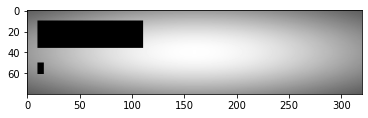

In [ ]:
## create black rectangle,:

# 
img_m = img.copy() # take a copy of basic pattern to add new features on it
img_m  = cv2.rectangle(img_m, (10,50), (10 + 5,50 + 10), (0,0,0), -1) #  we determine the position of upper left corner, and the hight and width of rectangle, position = (10,50), (width, high)=(10,10) respectively
img_m  = cv2.rectangle(img_m, (10,10), (10 + 100,10 + 25), (0,0,0), -1)
plt.imshow(img_m)

##Generate Low beam
To simplify our purpose, we consider the LB as if it's a 2D Gaussian distribution, with some modifiction on the upper right side, according to mondial regulations, so simply we generate a 2D matrix of coefficients, produced by gaussian function, and we modify the upper right side, as following: 


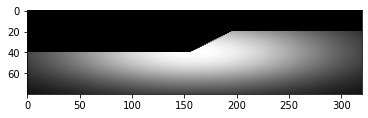

In [ ]:
mu,sigma=0,1.6;
G_LB=np.exp(-((X-mu)**2+(Y-mu)**2)/2.0*sigma**2)
# convert the coefficients matrix into Image format (gray level)
img_LB = 255* G_LB / G_LB.max()
# make it less lighter (short distance)
img_LB = 0.9* img_LB
img_LB = img_LB.astype(np.uint8)
LB = img_LB.copy()
G_LB.shape

for j in range(int(80/4)):
  for i in range(320):
    LB[j,i] = 0

i = int(320/2 + 350/10)
for j in range(int(80/4) ,int(80/2)):
  LB[j,0:i] = 0
  i = i - 2 


plt.gray()
plt.imshow(LB)

## Featured Low Beam

With the new technologies of headlamps, it's possible to project on the ground some helpful messages. Those messages are overlayed on the basic pattern of LB, as following:


<p align="center">
  <a href="url"><img src="https://raw.githubusercontent.com/mymehio/test/master/mercedes-digital-light2-300x200.jpg" align="middle" height="280" width="550" ></a>
</p>

To add these messages, you are given some small transparent images (pictograms), that you have to overlay them on LB randomly. So each time you have to randomaize a postion on LB pattern to overlay a pictogram, selected randomly as well

Here, you have an example how to overlay an image (small and transparent images) on a background ( low or high beam images):

In [ ]:
# first, get the images of pictograms
!wget --no-check-certificate \
    https://github.com/mymehio/test/blob/master/pictos_aivancity.zip?raw=true \
    -O pictos_aivancity.zip

--2021-12-17 14:15:05--  https://github.com/mymehio/test/blob/master/pictos_aivancity.zip?raw=true
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/mymehio/test/raw/master/pictos_aivancity.zip [following]
--2021-12-17 14:15:05--  https://github.com/mymehio/test/raw/master/pictos_aivancity.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/mymehio/test/master/pictos_aivancity.zip [following]
--2021-12-17 14:15:06--  https://raw.githubusercontent.com/mymehio/test/master/pictos_aivancity.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response.

In [ ]:
import os
import zipfile
'''
local_zip = 'pictos_aivancity.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('')
zip_ref.close()
'''

"\nlocal_zip = 'pictos_aivancity.zip'\nzip_ref = zipfile.ZipFile(local_zip, 'r')\nzip_ref.extractall('')\nzip_ref.close()\n"

In [ ]:
def logoOverlay(image,logo,alpha=1.0,x=0, y=0, scale=1):
  
    (h, w) = image.shape[:2]
    image = np.dstack([image, np.ones((h, w), dtype="uint8") * 255])

    overlay = cv2.resize(logo, None,fx=scale,fy=scale)
    (wH, wW) = overlay.shape[:2]
    output = image.copy()
    # blend the two images together using transparent overlays
    try:
        if x<0 : x = w+x
        if y<0 : y = h+y
        if x+wW > w: wW = w-x  
        if y+wH > h: wH = h-y 
        
        overlay=cv2.addWeighted(output[y:y+wH, x:x+wW],alpha,overlay[:wH,:wW],1,0)
        output[y:y+wH, x:x+wW] = overlay
        #output[y:y+wH, x:x+wW,2 ] = overlay
        #output[y:y+wH, x:x+wW,3 ] = overlay
    except Exception as e:
        print("Error: Logo position is overshooting image!")
        print(e)

    output= output[:,:,:3]
    return output

(60, 60, 4)


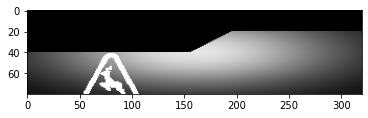

In [ ]:
overlay = cv2.imread('/content/pictos_aivancity/03.png',cv2.IMREAD_UNCHANGED)
print(overlay.shape)
rows,cols,channels = overlay.shape
LB_f = cv2.cvtColor(LB, cv2.COLOR_GRAY2RGB)
LB_f =logoOverlay(LB_f,overlay,alpha=1,x=50, y=40, scale=1) # scale=scale-0.1
plt.imshow(LB_f)

### Some examples of generated images
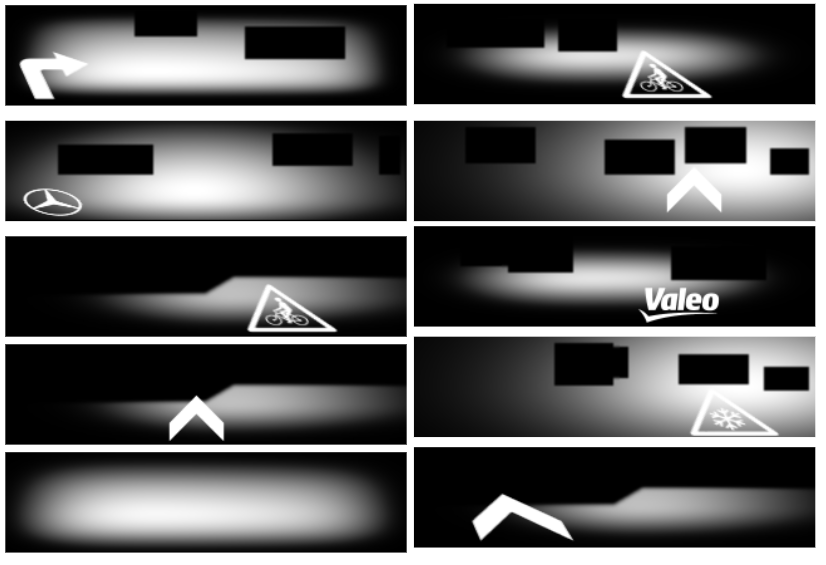

## First assignment
Right now, you know how to generate featured patterns of lighting, so to generate your data base, you have to generate randomly a lot of possibile positions of features, to be overlaied on basic patterns: (black rectangles on HB, and pictograms on LB)

Generation rules
- Generate black rectangles on the upper half of HB pattern (first 40 lines) 
- You can generate until 4 rectangles of different sizes
- limits of rectangles: w <= 80, and H<= 40
- Generate pictograms on the lower hlf of LB pattern (starting from 40th line to 80th
- You can generate only one pictogram by image
- The position of each added feature is generated randomly 
- the size of added pictogram can be changed via the argument scale of ***logoOverlay*** function
- you may add your own messages: but images must be transparent and png

- Generate a dataset of 1500 images, then split it into 80% and 20% as training and testing dataset respectively



Great!, you have a dataset to train & test your model


### Very important Tip

**Before you go further to train, please, put your dataset in a zip format, and then share it with me on google drive, to validate it by me**


# Generate random picture dataset


In [ ]:
import random
import numpy as np

funtions than will generate dimensions randomly

In [ ]:

def random_rectangle():

  while True:
    
    a = random.randrange(10, 301,20)
    w=random.randrange(10, 81,10)
    c = a + w
    b= random.randrange(5, 38,5)
    h=random.randrange(5, 41,5)
    d=b+ h
    if c<=300 and d<=38 and h<w :
      break
  
  return a, b, c, d
random_rectangle()

(130, 5, 210, 30)

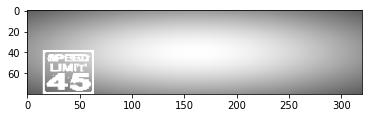

In [ ]:
def Random_overlay(image):
#position of x and y
  pos_x=random.randrange(5,265,10)
  pos_y=38
  image_index=random.randint(1,10)
  #print(image_index)
  overlay=cv2.imread('/content/pictos_aivancity/0' +str(image_index)+ '.png',cv2.IMREAD_UNCHANGED)
  rows,cols,channels = overlay.shape
  img_copy = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
  #add a condition that make the logo inside the beam 
  (h, w) = image.shape[:2] 
  #print(h)
  (wH, wW) = overlay.shape[:2]
  #print(wH)
  scale=1
  wH_scale=wH
  wW_scale=wW
  while pos_y+wH_scale > h:
    scale=scale-0.025
    #print('scale:',scale)
    wH_scale=wH*scale
    wW_scale=wW*scale
    #print("wH:",wH)

    #condition for ensuring that the width will not depass the border 
  while pos_x+wW_scale>w :
    pos_x=pos_x-10
    print(pos_x) 

  img_copy =logoOverlay(img_copy,overlay,alpha=1,x=pos_x, y=pos_y, scale=scale)
  return img_copy

img_cp=Random_overlay(img)
plt.imshow(img_cp)
matplotlib.image.imsave('try.png', img_cp)

## Generate dataset for high beam

In [ ]:

for i in range(750):
  img_m = img.copy()

  for j in range(random.randint(1,4)):  
    dimension=random_rectangle()
    img_m  = cv2.rectangle(img_m, (dimension[0],dimension[1]), (dimension[2],dimension[3]), (0,0,0), -1) #  we determine the position of upper left corner, and the hight and width of rectangle, position = (10,50), (width, high)=(10,10) respectively
  
  img_cp=Random_overlay(img_m)

  matplotlib.image.imsave('/content/drive/MyDrive/PROJECT_AIVANCITY/HighBeamDataset/HB'+ str(i) +'.png', img_cp)




## Generate dataset for low beam

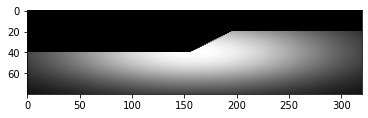

In [ ]:
mu,sigma=0,1.6;
G_LB=np.exp(-((X-mu)**2+(Y-mu)**2)/2.0*sigma**2)
# convert the coefficients matrix into Image format (gray level)
img_LB = 255* G_LB / G_LB.max()
# make it less lighter (short distance)
img_LB = 0.9* img_LB
img_LB = img_LB.astype(np.uint8)
LB = img_LB.copy()
G_LB.shape

for j in range(int(80/4)):
  for i in range(320):
    LB[j,i] = 0

i = int(320/2 + 350/10)
for j in range(int(80/4) ,int(80/2)):
  LB[j,0:i] = 0
  i = i - 2 


plt.gray()
plt.imshow(LB)

In [ ]:

for i in range(750):
  LB_f=Random_overlay(LB)
  matplotlib.image.imsave('/content/drive/MyDrive/PROJECT_AIVANCITY/LowBeamDataset/LB'+ str(i) +'.png', LB_f)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Import data from Your Google Drive

If you have your data already generated in Colab's workspace, so you have everything from data, you don't need bring them if they are available or their generation is so quick!, because as you know that when the session expires, evey data loaded will be gone. So, it's recommended that you keep a zip file of your data stored in your oun drive, and here you will learn how to connect to drive from colab to load your data .

**1) Run the following script in colab cell:**

then, Go to the mentioned link, and 

**2) Copy the authorization code of your account.**

In [ ]:

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


**3)Paste the authorization code into the output field**
Then you will get your drive mounted

Then will copy you zip file of data, by specifing its path on Drive

Then, unzip your file, 

Cheers!!we have data available !!

In [ ]:
#! cp  -a '/content/drive/MyDrive/PROJECT_AIVANCITY/Dataset.zip'
#! unzip Dataset.zip 
import os
import zipfile


local_zip = '/content/drive/MyDrive/PROJECT_AIVANCITY/Dataset.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('')
zip_ref.close()




## Let's start building the model of Autoencoder

### 1 - Libraries Importation

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals


import tensorflow as tf
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import logging
import os
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import UpSampling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Reshape
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Lambda
from tensorflow.keras.models import Model,load_model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import initializers
import shutil

from numba import cuda 


from pathlib import Path

!pip install progressbar

from time import sleep
import sys
from imutils import paths
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

import imageio
import skimage
from skimage import color
from skimage import transform
import pathlib
import cv2
logger = tf.get_logger()
logger.setLevel(logging.ERROR)


#eager tensor
tf.compat.v1.disable_eager_execution()




  Created wheel for progressbar: filename=progressbar-2.5-py3-none-any.whl size=12082 sha256=8d7cb7f5cfd3b70eed5a4f7db0cc2aa4132754e9c829b1df9ceecb7d6c1e586e
  Stored in directory: /root/.cache/pip/wheels/f0/fd/1f/3e35ed57e94cd8ced38dd46771f1f0f94f65fec548659ed855
Successfully built progressbar


In [ ]:
### 2 - Data Loading

Dataset='/content/Dataset'

In [ ]:
data_set_path = 'Dataset' # the path to dataset


HEIGHT = 80
WIDTH = 320
IMAGE_SIZE = (HEIGHT, WIDTH)



print("[MSg] loading images...")
imagePaths = list(paths.list_images(data_set_path))
num = len(imagePaths)
#print(imagePaths)
data = []
dims = []
# loop over the image paths
c = 1


for imagePath in imagePaths:

    image = imageio.imread(imagePath)
    image = image[:,:,1]
    dims.append(image.shape)
    #image = image.astype(np.float)
    image = skimage.transform.resize(image, IMAGE_SIZE, preserve_range=True)
    # update the data and labels lists, respectively
    data.append(image)
    c = c + 1
    sys.stdout.write('\r')
    # the exact output you're looking for:
    
    sys.stdout.write("[{:{}}] {:.1f}%".format("="*round(100/(num-1)*c), 10, (100/(num-1)*c)))
    sys.stdout.flush()
    #sleep(0.001)
    
    
print("[MSg] loading images finished!")


[MSg] loading images...
[====================================================================================================] 100.1%[MSg] loading images finished!


### 3 - Spit the dataset int train and test

In [ ]:
from sklearn.model_selection import train_test_split
(trainX, testX, _, _) = train_test_split(data, data, test_size=0.20, random_state=None)


trainX = np.expand_dims(trainX, axis=-1)
testX = np.expand_dims(testX, axis=-1)

#normalize data
trainX = trainX.astype("float32") / 255.0
testX = testX.astype("float32") / 255.0

In [ ]:
print(trainX.shape)

(1200, 80, 320, 1)


### 4 - Model architecture 

In [ ]:
def AE_Model(filters, latentDim): 


    HEIGHT = 80 
    WIDTH = 320 
    width =WIDTH
    height = HEIGHT

    padding_="same"
    depth=1


    ##### Building the encoder ################

    inputShape = (height, width, depth)
    # define the input to the encoder
    input_img = Input(shape=inputShape)

    ############################################################################
    x = Conv2D(filters[0], (3, 3), padding='same')(input_img)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    ############################################################################
    x = Conv2D(filters[1], (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    ############################################################################
    x = Conv2D(filters[2], (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    
    ############################################################################
    x = Conv2D(filters[3], (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('sigmoid')(x)
    encoded = MaxPooling2D((2, 2), padding='same')(x)

    # flatten the network and then construct our latent vector
    volumeSize = K.int_shape(encoded)
    x = Flatten()(encoded)
    latent = Dense(latentDim)(x)
    encoder = Model(input_img, latent, name="encoder")


    ##### Building the Decoder ################
    
    latentInputs = Input(shape=(latentDim,))
    x = Dense(np.prod(volumeSize[1:]))(latentInputs)
    x = Reshape((volumeSize[1], volumeSize[2], volumeSize[3]))(x)  # becomes like encoded 2D


    ############################################################################
    x = Conv2D(filters[3], (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = UpSampling2D((2, 2))(x)


    ############################################################################
    x = Conv2D(filters[2], (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = UpSampling2D((2, 2))(x)

    
    ############################################################################
    x = Conv2D(filters[1], (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = UpSampling2D((2, 2))(x)

    
    ############################################################################
    x = Conv2D(filters[0], (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)


    x = UpSampling2D((2, 2))(x)
    x = Conv2D(1, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    #print(x.shape)
    decoded = Activation('sigmoid')(x)
    # build the decoder model
    decoder = Model(latentInputs, decoded, name="decoder")
    # our autoencoder is the encoder + decoder
    autoencoder = Model(input_img, decoder(encoder(input_img)),name="autoencoder")
    return encoder, decoder, autoencoder


In [ ]:
#filters=(128, 64, 32,16)
#filters=(256, 128,64, 64)
#filters=(512, 256,128, 64)
filters=(256, 128,64, 32)
#filters=(256, 128,128, 32)
latentDim=1024 #Dim on latent vector

# note that the model can be separated into encoder and decoder
encoder, decoder, autoencoder=AE_Model(filters, latentDim)
autoencoder.summary()

Model: "autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(None, 80, 320, 1)]      0         
                                                                 
 encoder (Functional)        (None, 1024)              3669600   
                                                                 
 decoder (Functional)        (None, 80, 320, 1)        3680997   
                                                                 
Total params: 7,350,597
Trainable params: 7,348,675
Non-trainable params: 1,922
_________________________________________________________________


### 5 - Train the model

In [ ]:
def trainModels(filters, latentDim, EPOCHS, BS): 

    encoder, decoder, autoencoder=AE_Model(filters, latentDim)
  

    ##Name= "AE_V1_4167"
    %reload_ext tensorboard
    #!ls logs
    #!rm -r savingPath + 'logs/fit/'
    key = 'v1'
    from datetime import datetime

    pathTensorBoard= "AE-Trained Compression Models/logs/"
    log_dir = datetime.now().strftime("res_%Y%m%d-%H%M%S")
    %load_ext tensorboard
    #%tensorboard --logdir log_dir
    %tensorboard --logdir 'output'

    #opt = Adam(learning_rate=1e-2)
    opt = Adam(learning_rate=1e-3)
       # to test adamax optimizer too
    #autoencoder.compile(loss="binary_crossentropy", optimizer=opt, metrics=['acc']) # loss function is to be tested with few posibilities    loss='mse'
    autoencoder.compile(loss="mse", optimizer=opt, metrics=['acc'])
    tensorboard = tf.keras.callbacks.TensorBoard(log_dir='output/log_%s_model' % key)
    #tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)

    H = autoencoder.fit(
      trainX, trainX,
      validation_data=(testX, testX),
      epochs=EPOCHS,
      batch_size=BS,
      callbacks=[tensorboard])

    return autoencoder, H

    


In [ ]:
listOfFilters=[(256, 128,64, 32)]
latentDim=1024
#latentDim=512
EPOCHS =120  # augmenter epochs
#BS =16  # modify batch size to 32 
#BS =64
BS =32

pathToSaveTheModel = '/content/drive/MyDrive/PROJECT_AIVANCITY/MODEL'
for filtr in listOfFilters: 
        
    autoencoder , H =trainModels(filtr, latentDim, EPOCHS, BS)
    
    nameOfFolder="AE-V1-4000-1-3-tunnels-"+"F-"+str(filtr)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)
    savingPath=pathToSaveTheModel+nameOfFolder+"/"
    nameOfTheModel= "AE-V1-4000-1-3-tunnels-Model-"+"F-"+str(filtr)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)
    encoder.save(savingPath+nameOfTheModel+'- encoder.h5')
    decoder.save(savingPath+nameOfTheModel+' - decoder.h5')
    autoencoder.save(savingPath+nameOfTheModel+' - autoencoder.h5')

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 471), started 4:43:29 ago. (Use '!kill 471' to kill it.)

<IPython.core.display.Javascript object>

Train on 1200 samples, validate on 300 samples
Epoch 1/120
1200/1200 [==============================] - ETA: 0s - loss: 0.0462 - acc: 0.2022

/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2057: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


1200/1200 [==============================] - 15s 12ms/sample - loss: 0.0462 - acc: 0.2022 - val_loss: 0.2074 - val_acc: 0.0118
Epoch 2/120
1200/1200 [==============================] - 8s 7ms/sample - loss: 0.0279 - acc: 0.2011 - val_loss: 0.1083 - val_acc: 0.0130
Epoch 3/120
1200/1200 [==============================] - 8s 7ms/sample - loss: 0.0259 - acc: 0.2032 - val_loss: 0.0909 - val_acc: 0.0417
Epoch 4/120
1200/1200 [==============================] - 8s 7ms/sample - loss: 0.0248 - acc: 0.2039 - val_loss: 0.0784 - val_acc: 0.1033
Epoch 5/120
1200/1200 [==============================] - 8s 7ms/sample - loss: 0.0244 - acc: 0.2045 - val_loss: 0.0683 - val_acc: 0.1479
Epoch 6/120
1200/1200 [==============================] - 8s 7ms/sample - loss: 0.0229 - acc: 0.2053 - val_loss: 0.0548 - val_acc: 0.1716
Epoch 7/120
1200/1200 [==============================] - 8s 7ms/sample - loss: 0.0229 - acc: 0.2046 - val_loss: 0.0601 - val_acc: 0.1699
Epoch 8/120
1200/1200 [============================


## You may save your trained model and some stuff



In [ ]:
'''
# Where to save the model
#pathToSaveTheModel="/content/drive/MyDrive/aivancity/Cours/Deep learning methods & applications/courses/project/AE-Trained Compression Models/"
pathToSaveTheModel = '/content/drive/MyDrive/PROJECT_AIVANCITY/MODEL'
nameOfFolder="AE-V1-4000-1-3-tunnels-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)
savingPath=pathToSaveTheModel+nameOfFolder+"/"
nameOfTheModel= "AE-V1-4000-1-3-tunnels-Model-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)


encoder.save(savingPath+nameOfTheModel+'- encoder.h5')
decoder.save(savingPath+nameOfTheModel+' - decoder.h5')
autoencoder.save(savingPath+nameOfTheModel+' - autoencoder.h5')

'''

### Plot 



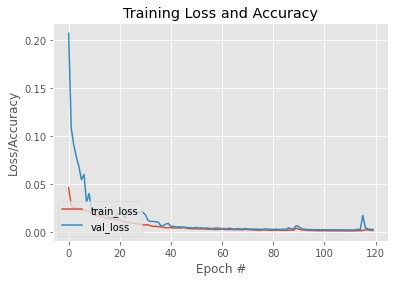

In [ ]:
# construct a plot that plots and saves the training history
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
#plt.plot(N, H.history["accuracy"], label="train_acc")
#plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

nameOfFigure="AE-V1-4000-1-3-tunnels-LossFigure-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)+".png"
plt.savefig(savingPath+nameOfFigure)

pathToSaveLossGraphs = pathToSaveTheModel+"LossGraphs/"+nameOfFigure
#import os.path
from os import path

if path.exists(pathToSaveTheModel+"LossGraphs/") == False:
  os.mkdir(pathToSaveTheModel+"LossGraphs/")

plt.savefig(pathToSaveLossGraphs)

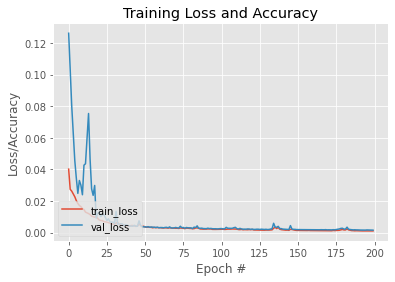

In [ ]:
# construct a plot that plots and saves the training history
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
#plt.plot(N, H.history["accuracy"], label="train_acc")
#plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

nameOfFigure="AE-V1-4000-1-3-tunnels-LossFigure-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)+".png"
plt.savefig(savingPath+nameOfFigure)

pathToSaveLossGraphs = pathToSaveTheModel+"LossGraphs/"+nameOfFigure
#import os.path
from os import path

if path.exists(pathToSaveTheModel+"LossGraphs/") == False:
  os.mkdir(pathToSaveTheModel+"LossGraphs/")

plt.savefig(pathToSaveLossGraphs)

In [ ]:

autoencoder = load_model('/content/drive/MyDrive/PROJECT_AIVANCITY/MODELAE-V1-4000-1-3-tunnels-F-(256, 128, 64, 32)-LDim-1024-EP-200-BS-32/AE-V1-4000-1-3-tunnels-Model-F-(256, 128, 64, 32)-LDim-1024-EP-200-BS-32 - autoencoder.h5')

Prediction

In [ ]:
# use the convolutional autoencoder to make predictions on the
    # testing images, then initialize our list of output images
print("[MSg] making predictions...")

decoded = autoencoder.predict(testX)
outputs = None

# loop over our number of output samples
for i in range(0, 10):
    # grab the original image and reconstructed image
  original = (testX[i] * 255).astype("uint8")
  recon = (decoded[i] * 255).astype("uint8")

  difference=abs(recon-original)
  difference = (difference).astype("uint8")
  output = np.hstack([original, recon, difference])

 # if the outputs array is empty, initialize it as the current
 # side-by-side image display
  if outputs is None:
    outputs = output
   # otherwise, vertically stack the outputs
  else:
    outputs = np.vstack([outputs, output])
   # save the outputs image to disk
print("[MSg] output written to disk...")

#print(outputs.shape)
#outputs = np.expand_dims(outputs, axis=1)  # or axis=1
outputs = outputs.reshape(80*(i+1), 960)
#outputs = outputs.reshape(56*(i+1), 112)
#print(outputs.shape)
plt.gray()
plt.figure(figsize=(600,200))
plt.imshow(outputs)
plt.show()
psnr_avrg =cv2.PSNR(testX*255, decoded*255)
psnr_avrg= round(psnr_avrg,2)

nameOfOutputImages="AE-V1-4000-1-3-tunnels-Outputs-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)+"--PSNR--"+str(psnr_avrg)+".png"
cv2.imwrite(savingPath+nameOfOutputImages, outputs)
cv2.imwrite(pathToSaveTheModel+"OutputImages/"+nameOfOutputImages, outputs)

print(nameOfTheModel + " DONE!")



[MSg] making predictions...


/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[MSg] output written to disk...


<Figure size 432x288 with 0 Axes>

AE-V1-4000-1-3-tunnels-Model-F-(512, 256, 128, 64)-LDim-1024-EP-200-BS-32 DONE!


In [ ]:
# use the convolutional autoencoder to make predictions on the
    # testing images, then initialize our list of output images
print("[MSg] making predictions...")

decoded = autoencoder.predict(testX)
outputs = None

# loop over our number of output samples
for i in range(0, 10):
    # grab the original image and reconstructed image
  original = (testX[i] * 255).astype("uint8")
  recon = (decoded[i] * 255).astype("uint8")

  difference=abs(recon-original)
  difference = (difference).astype("uint8")
  output = np.hstack([original, recon, difference])

 # if the outputs array is empty, initialize it as the current
 # side-by-side image display
  if outputs is None:
    outputs = output
   # otherwise, vertically stack the outputs
  else:
    outputs = np.vstack([outputs, output])
   # save the outputs image to disk
print("[MSg] output written to disk...")

#print(outputs.shape)
#outputs = np.expand_dims(outputs, axis=1)  # or axis=1
outputs = outputs.reshape(80*(i+1), 960)
#outputs = outputs.reshape(56*(i+1), 112)
#print(outputs.shape)
plt.gray()
plt.figure(figsize=(600,200))
plt.imshow(outputs)
plt.show()
psnr_avrg =cv2.PSNR(testX*255, decoded*255)
psnr_avrg= round(psnr_avrg,2)

nameOfOutputImages="AE-V1-4000-1-3-tunnels-Outputs-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)+"--PSNR--"+str(psnr_avrg)+".png"
cv2.imwrite(savingPath+nameOfOutputImages, outputs)
cv2.imwrite(pathToSaveTheModel+"OutputImages/"+nameOfOutputImages, outputs)

print(nameOfTheModel + " DONE!")



[MSg] making predictions...


/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[MSg] output written to disk...


<Figure size 432x288 with 0 Axes>

AE-V1-4000-1-3-tunnels-Model-F-(256, 128, 64, 64)-LDim-1024-EP-200-BS-32 DONE!


In [ ]:
# use the convolutional autoencoder to make predictions on the
    # testing images, then initialize our list of output images
print("[MSg] making predictions...")

decoded = autoencoder.predict(testX)
outputs = None

# loop over our number of output samples
for i in range(0, 10):
    # grab the original image and reconstructed image
  original = (testX[i] * 255).astype("uint8")
  recon = (decoded[i] * 255).astype("uint8")

  difference=abs(recon-original)
  difference = (difference).astype("uint8")
  output = np.hstack([original, recon, difference])

 # if the outputs array is empty, initialize it as the current
 # side-by-side image display
  if outputs is None:
    outputs = output
   # otherwise, vertically stack the outputs
  else:
    outputs = np.vstack([outputs, output])
   # save the outputs image to disk
print("[MSg] output written to disk...")

#print(outputs.shape)
#outputs = np.expand_dims(outputs, axis=1)  # or axis=1
outputs = outputs.reshape(80*(i+1), 960)
#outputs = outputs.reshape(56*(i+1), 112)
#print(outputs.shape)
plt.gray()
plt.figure(figsize=(600,200))
plt.imshow(outputs)
plt.show()
psnr_avrg =cv2.PSNR(testX*255, decoded*255)
psnr_avrg= round(psnr_avrg,2)

nameOfOutputImages="AE-V1-4000-1-3-tunnels-Outputs-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)+"--PSNR--"+str(psnr_avrg)+".png"
cv2.imwrite(savingPath+nameOfOutputImages, outputs)
cv2.imwrite(pathToSaveTheModel+"OutputImages/"+nameOfOutputImages, outputs)

print(nameOfTheModel + " DONE!")

[MSg] making predictions...


/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[MSg] output written to disk...


<Figure size 432x288 with 0 Axes>

AE-V1-4000-1-3-tunnels-Model-F-(128, 64, 32, 16)-LDim-1024-EP-200-BS-16 DONE!


In [ ]:
# use the convolutional autoencoder to make predictions on the
    # testing images, then initialize our list of output images
print("[MSg] making predictions...")

decoded = autoencoder.predict(testX)
outputs = None

# loop over our number of output samples
for i in range(0, 10):
    # grab the original image and reconstructed image
  original = (testX[i] * 255).astype("uint8")
  recon = (decoded[i] * 255).astype("uint8")

  difference=abs(recon-original)
  difference = (difference).astype("uint8")
  output = np.hstack([original, recon, difference])

 # if the outputs array is empty, initialize it as the current
 # side-by-side image display
  if outputs is None:
    outputs = output
   # otherwise, vertically stack the outputs
  else:
    outputs = np.vstack([outputs, output])
   # save the outputs image to disk
print("[MSg] output written to disk...")

#print(outputs.shape)
#outputs = np.expand_dims(outputs, axis=1)  # or axis=1
outputs = outputs.reshape(80*(i+1), 960)
#outputs = outputs.reshape(56*(i+1), 112)
#print(outputs.shape)
plt.gray()
plt.figure(figsize=(600,200))
plt.imshow(outputs)
plt.show()
psnr_avrg =cv2.PSNR(testX*255, decoded*255)
psnr_avrg= round(psnr_avrg,2)

nameOfOutputImages="AE-V1-4000-1-3-tunnels-Outputs-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)+"--PSNR--"+str(psnr_avrg)+".png"
cv2.imwrite(savingPath+nameOfOutputImages, outputs)
cv2.imwrite(pathToSaveTheModel+"OutputImages/"+nameOfOutputImages, outputs)

print(nameOfTheModel + " DONE!")

[MSg] making predictions...


/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[MSg] output written to disk...


<Figure size 432x288 with 0 Axes>

AE-V1-4000-1-3-tunnels-Model-F-(256, 128, 128, 32)-LDim-1024-EP-150-BS-32 DONE!


In [ ]:
# use the convolutional autoencoder to make predictions on the
    # testing images, then initialize our list of output images
print("[MSg] making predictions...")

decoded = autoencoder.predict(testX)
outputs = None

# loop over our number of output samples
for i in range(0, 10):
    # grab the original image and reconstructed image
  original = (testX[i] * 255).astype("uint8")
  recon = (decoded[i] * 255).astype("uint8")

  difference=abs(recon-original)
  difference = (difference).astype("uint8")
  output = np.hstack([original, recon, difference])

 # if the outputs array is empty, initialize it as the current
 # side-by-side image display
  if outputs is None:
    outputs = output
   # otherwise, vertically stack the outputs
  else:
    outputs = np.vstack([outputs, output])
   # save the outputs image to disk
print("[MSg] output written to disk...")

#print(outputs.shape)
#outputs = np.expand_dims(outputs, axis=1)  # or axis=1
outputs = outputs.reshape(80*(i+1), 960)
#outputs = outputs.reshape(56*(i+1), 112)
#print(outputs.shape)
plt.gray()
plt.figure(figsize=(600,200))
plt.imshow(outputs)
plt.show()
psnr_avrg =cv2.PSNR(testX*255, decoded*255)
psnr_avrg= round(psnr_avrg,2)

nameOfOutputImages="AE-V1-4000-1-3-tunnels-Outputs-"+"F-"+str(filters)+"-LDim-"+str(latentDim)+"-EP-"+str(EPOCHS)+"-BS-"+str(BS)+"--PSNR--"+str(psnr_avrg)+".png"
cv2.imwrite(savingPath+nameOfOutputImages, outputs)
cv2.imwrite(pathToSaveTheModel+"OutputImages/"+nameOfOutputImages, outputs)

print(nameOfTheModel + " DONE!")

[MSg] making predictions...


/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[MSg] output written to disk...


<Figure size 432x288 with 0 Axes>

AE-V1-4000-1-3-tunnels-Model-F-(256, 128, 64, 32)-LDim-1024-EP-120-BS-32 DONE!


In [ ]:
psnr_avrg #first model with olddatset

28.21

In [ ]:
psnr_avrg # /content/drive/MyDrive/PROJECT_AIVANCITY/MODELAE-V1-4000-1-3-tunnels-F-(128, 64, 32, 16)-LDim-1024-EP-200-BS-16/AE-V1-4000-1-3-tunnels-Model-F-(128, 64, 32, 16)-LDim-1024-EP-200-BS-16 - autoencoder.h5

27.88

In [ ]:
psnr_avrg # 64-8

26.38

In [ ]:
psnr_avrg # 128-16 1024 32

28.07

In [ ]:
psnr_avrg # (128, 64, 32, 16)-LDim-512-EP-200-BS-32

25.52

In [ ]:
psnr_avrg # 64-8 1024 32

26.36

In [ ]:
psnr_avrg #/content/drive/MyDrive/PROJECT_AIVANCITY/MODELAE-V1-4000-1-3-tunnels-F-(256, 128, 64, 32)-LDim-1024-EP-200-BS-32/AE-V1-4000-1-3-tunnels-Model-F-(256, 128, 64, 32)-LDim-1024-EP-200-BS-32 - autoencoder.h5

28.21

In [ ]:
psnr_avrg #/content/drive/MyDrive/PROJECT_AIVANCITY/MODELAE-V1-4000-1-3-tunnels-F-(256, 128, 64, 32)-LDim-1024-EP-200-BS-64/AE-V1-4000-1-3-tunnels-Model-F-(256, 128, 64, 32)-LDim-1024-EP-200-BS-64 - autoencoder.h5

26.85

In [ ]:
psnr_avrg#/content/drive/MyDrive/PROJECT_AIVANCITY/MODELAE-V1-4000-1-3-tunnels-F-(256, 128, 64, 64)-LDim-1024-EP-200-BS-32/AE-V1-4000-1-3-tunnels-Model-F-(256, 128, 64, 64)-LDim-1024-EP-200-BS-32 - autoencoder.h5

26.93

In [ ]:
psnr_avrg#/content/drive/MyDrive/PROJECT_AIVANCITY/MODELAE-V1-4000-1-3-tunnels-F-(512, 256, 128, 64)-LDim-1024-EP-200-BS-32/AE-V1-4000-1-3-tunnels-Model-F-(512, 256, 128, 64)-LDim-1024-EP-200-BS-32 - autoencoder.h5

27.5

In [ ]:
psnr_avrg #Model-F-(256, 128, 128, 32)-LDim-1024-EP-150-BS-32 DONE!

27.44

In [ ]:
psnr_avrg

25.39

## Conclusion

After generating the dataset, we fine tune the autoencoder model by modifying the following parameters: 

*   filters
*   latent dimension
*   batch size
*   epoches 

For each experiment, we fix three parameters, and change the fourth one, to have an optimal value for that specific parameters. 

We begin a filter as (16, 32, 64, 128), however, we find out that the ascending order does not give an expected value, the psnr_avrg is only around 24. 
So, we begin with a desvending order of the convlutional filter size. 


We have done several test: 
1. F-(128, 64, 32, 16)
LDim-1024
EP-200
BS-16

**psnr avrg: 27.88**

2. F-(128, 64, 32, 16) 
LDim-1024
BS-32

**psnr avrg: 28.07**


--> Batch size **32** gives a better result 

Then we start to increase the filter size

3. F-(256, 128, 64, 32)
LDim-1024
EP-200
BS-32

**psnr avrg: 28.21**

4. F-(512, 256, 128, 64)
LDim-1024
EP-200
BS-32

**psnr avrg: 27.55**

--> **F-(256, 128, 64, 32)** give the best result.



5. F-(128, 64, 32, 16)
LDim-512
EP-200
BS-32

**25.52**

--> We have also tried to modify the latent dimension to 2048 and 512 both of them gave inferior result. 


As conclusion, our model achieved the best result with this combinations: 

F-(256, 128, 64, 32)
LDim-1024
EP-200
BS-32

And the final result of **psnr avrg is 28.21**. 


Remark: We have also tried to modify the filters as 
(256, 128, 64, 64) (256, 128, 128, 32), neither of them gives a better result. 

In order to increase the result again, we think we need to increase the size of dataset. 
